In [1]:
import pandas as pd
import numpy as np
import glob
from pathlib import Path
import os
import plotly.graph_objects as go
import plotly.express as px
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
from entry_points.run_experiment import run_experiment
from config.config import Config
from metrics.metrics import cosine_similarity

# 環境設定

In [3]:
SETTING_PATH="./settings/"
RESULT_PATH="./results/"

# 関数定義

In [39]:
def make_convert_dict(y):
    convert_dict = {}
    for i, target in enumerate(sorted(list(set(y)))):
        convert_dict[target] = i
    return convert_dict

# 分析

## 予測

In [4]:
# 設定ファイル読み込み
cfgs = []
for f in glob.glob(os.path.join(SETTING_PATH, "*.yaml")):
    cfg = Config(f)
    cfg["eval_csv_save_path"] = os.path.join(RESULT_PATH, f'eval_{cfg["run_name"]}.csv')
    cfg["test_csv_save_path"] = os.path.join(RESULT_PATH, f'test_{cfg["run_name"]}.csv')
    cfgs.append(cfg)

In [ ]:
# 実験
for cfg in cfgs:
    run_experiment(cfg)

[1]	valid_0's multi_logloss: 2.25854
Training until validation scores don't improve for 10 rounds
[2]	valid_0's multi_logloss: 2.2446
[3]	valid_0's multi_logloss: 2.23319
[4]	valid_0's multi_logloss: 2.2236
[5]	valid_0's multi_logloss: 2.21532
[6]	valid_0's multi_logloss: 2.20835
[7]	valid_0's multi_logloss: 2.20218
[8]	valid_0's multi_logloss: 2.19679
[9]	valid_0's multi_logloss: 2.19219
[10]	valid_0's multi_logloss: 2.18798
[11]	valid_0's multi_logloss: 2.1841
[12]	valid_0's multi_logloss: 2.18074
[13]	valid_0's multi_logloss: 2.17762
[14]	valid_0's multi_logloss: 2.17474
[15]	valid_0's multi_logloss: 2.17209
[16]	valid_0's multi_logloss: 2.16961
[17]	valid_0's multi_logloss: 2.1673
[18]	valid_0's multi_logloss: 2.16513
[19]	valid_0's multi_logloss: 2.16314
[20]	valid_0's multi_logloss: 2.16127
[21]	valid_0's multi_logloss: 2.1596
[22]	valid_0's multi_logloss: 2.15796
[23]	valid_0's multi_logloss: 2.15644
[24]	valid_0's multi_logloss: 2.15502
[25]	valid_0's multi_logloss: 2.15348
[26

/Users/ryusuke/anaconda3/envs/work/lib/python3.9/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


[1]	valid_0's rmse: 0.997625
Training until validation scores don't improve for 10 rounds
[2]	valid_0's rmse: 0.99728
[3]	valid_0's rmse: 0.996872
[4]	valid_0's rmse: 0.996548
[5]	valid_0's rmse: 0.996257
[6]	valid_0's rmse: 0.995974
[7]	valid_0's rmse: 0.995614
[8]	valid_0's rmse: 0.995299
[9]	valid_0's rmse: 0.995057
[10]	valid_0's rmse: 0.994781
[11]	valid_0's rmse: 0.99453
[12]	valid_0's rmse: 0.994299
[13]	valid_0's rmse: 0.994118
[14]	valid_0's rmse: 0.993902
[15]	valid_0's rmse: 0.993685
[16]	valid_0's rmse: 0.993443
[17]	valid_0's rmse: 0.993193
[18]	valid_0's rmse: 0.993004
[19]	valid_0's rmse: 0.992725
[20]	valid_0's rmse: 0.992537
[21]	valid_0's rmse: 0.992353
[22]	valid_0's rmse: 0.992087
[23]	valid_0's rmse: 0.991892
[24]	valid_0's rmse: 0.991727
[25]	valid_0's rmse: 0.991463
[26]	valid_0's rmse: 0.991324
[27]	valid_0's rmse: 0.991125
[28]	valid_0's rmse: 0.990923
[29]	valid_0's rmse: 0.990757
[30]	valid_0's rmse: 0.990636
[31]	valid_0's rmse: 0.990514
[32]	valid_0's rmse:

## 結果確認

In [31]:
cls_result = pd.read_csv(Path(RESULT_PATH, "eval_classifier_add_group.csv"))

In [8]:
cls_result.head()

,y,y_pred
0,0.156173,0.866310
1,0.156173,0.362014
2,-0.151763,-0.151763
3,-0.151763,0.000415
4,0.156173,-0.315091


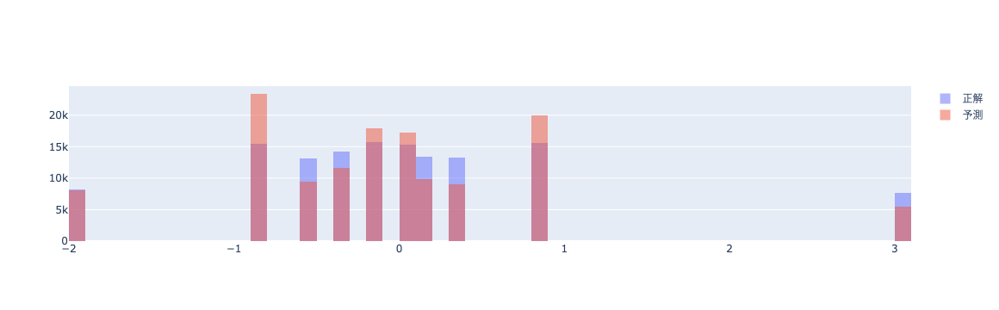

In [16]:
fig = go.Figure(
    data = [
        go.Histogram(x=cls_result["y"], opacity=0.5, name="正解"),
        go.Histogram(x=cls_result["y_pred"], opacity=0.5, name="予測")
    ]
)
fig.update_layout(barmode='overlay')
fig.show()

In [21]:
print(f"結果のshape：{cls_result.shape}")
print(f"一致するレコード数：{sum(cls_result['y'] == cls_result['y_pred'])}")

結果のshape：(132000, 2)
一致するレコード数：38934


In [41]:
cls_result.head()

,y,y_pred
0,0.156173,0.866310
1,0.156173,0.362014
2,-0.151763,-0.151763
3,-0.151763,0.000415
4,0.156173,-0.315091


In [44]:
convert_dict = make_convert_dict(cls_result["y"])
cls_result["y_category"] = cls_result["y"].apply(lambda x: convert_dict[x])
cls_result["y_pred_category"] = cls_result["y_pred"].apply(lambda x: convert_dict[x])
cls_result.head()

,y,y_pred,y_category,y_pred_category
0,0.156173,0.866310,6,8
1,0.156173,0.362014,6,7
2,-0.151763,-0.151763,4,4
3,-0.151763,0.000415,4,5
4,0.156173,-0.315091,6,3


<AxesSubplot:>

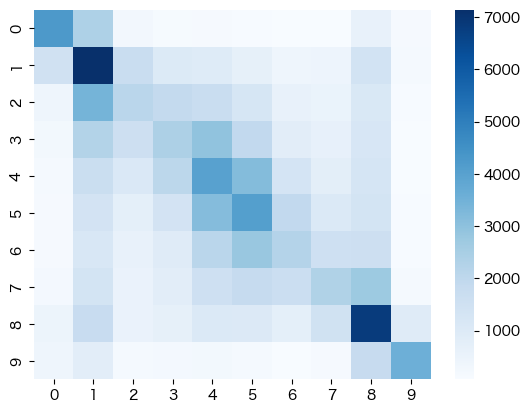

In [50]:
cm = confusion_matrix(cls_result["y_category"], cls_result["y_pred_category"])
sns.heatmap(cm, cmap='Blues')

## 番外編：cosine_similarity関数に間違いがないかの確認
- 結論：以下リンク先notebookと一致していたため大丈夫そう
    - https://competition.nishika.com/competitions/finance_ts/topics/614

In [5]:
train = pd.read_parquet("../../data/train.parquet")

In [6]:
target = train.loc[650000: , 'target'].copy()

In [7]:
# 実績値も予測値も正になるよう、ダミーの予測値を生成。
target_pred = np.zeros(target.shape)
target_pred[target == 0.0004145131807259] = 0.0004145131807259 + 0.1
target_pred[target == 0.1561732225137469] = 0.1561732225137469 + 0.2

In [8]:
cosine_similarity(target, target_pred)

0.11726057579640228

In [9]:
# 実績値は正だが予測値は負になるよう、ダミーの予測値を生成。
target_pred = np.zeros(target.shape)
target_pred[target == 0.0004145131807259] = 0.0004145131807259 - 0.1
target_pred[target == 0.1561732225137469] = 0.1561732225137469 - 0.2

In [10]:
cosine_similarity(target, target_pred)

-0.04494587945777902